In [1]:
import spacy
import pandas as pd
from spacy.matcher import Matcher
from spacy_wordnet.wordnet_annotator import WordnetAnnotator 
nlp = spacy.load("en_core_web_lg")
nnlp = spacy.load("en_core_web_lg")
nlp.add_pipe("merge_entities")
nlp.add_pipe("merge_noun_chunks")
import json
from matplotlib import pyplot as plt
from pandas import DataFrame
import cv2
from elasticsearch import Elasticsearch
import re
import nltk
from nltk.corpus import wordnet as wn
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from rake_nltk import Rake


In [3]:
from elasticsearch import helpers
client = Elasticsearch(
    "http://localhost:9200",
     basic_auth=("elastic", "elastic")

)
resp = client.info()

In [4]:
class QuestionMatcher:
    def __init__(self):
        self.patterns= []
        self.q_json = self.get_questions_json()
        self.matcher = Matcher(nlp.vocab)
        r= Rake()

    def get_questions_json(self):
        with open('questions.json', 'r') as f:
            pat = json.load(f)
        return pat
    
    def define_keyword(self,question:str):
        keyword = 'none'
        index = -1
        for q in self.q_json:
            if q['keyword'] in question.lower():
                keyword = q['keyword']
                index = q['qid']
        return keyword, index


    def try_get_eat(self, focus):
        person_ss = set(ss.name() for ss in wn.synsets("person"))
        location_ss = set(ss.name() for ss in wn.synsets("location"))
        time_ss = set(ss.name() for ss in wn.synsets("time_unit"))
        # animal_ss = set(ss.name() for ss in wn.synsets("animal"))
        # artifact_ss = set(ss.name() for ss in wn.synsets("artifact"))
        for token in focus.split():
            if nlp(token)[0].is_stop:
                continue
            print(token)
            focus_lamma = nlp(token)[0].lemma_
            if wn.synsets(focus_lamma) == []:
                return "entity"
            focus_ss = wn.synsets(focus_lamma)[0]
            
            hypernyms_ss = {synset.name() for synset in wn.synset(focus_ss.name()).hypernym_paths()[0]}
            if len(person_ss.intersection(hypernyms_ss)) != 0:
                return "person"
            if len(location_ss.intersection(hypernyms_ss)) != 0:
                return "location" 
            if len(time_ss.intersection(hypernyms_ss)) != 0:
                return "time_unit"
            # if len(animal_ss.intersection(hypernyms_ss)) != 0:
            #     return "animal"
            # if len(artifact_ss.intersection(hypernyms_ss)) != 0:
            #     return "artifact"
        return "entity"


    def keyword_extraction(self,q):
        self.r.extract_keywords_from_text(q)
        keywordList           = []
        rankedList            = r.get_ranked_phrases_with_scores()
        print(rankedList[0][0])
        keywords = ''
        for keyword in rankedList:
            if keyword[0] > 1:
                keyword_updated       = keyword[1].split()
                keyword_updated_string    = " ".join(keyword_updated[:2])
                keywordList.append(keyword_updated_string)
                keywords = keywords + ' ' + keyword_updated_string
            # if(len(keywordList)>9):
            #     break
        return keywords

    def re_get_focus(self,question:str,ind,pattern):
        question_token = [token.text for token in nlp(question)]
        focus = ''
        focus_pos = pattern['focus']
        start = 0
        i = 0
        for token in focus_pos[ind].split('\s*'):
                if(token == 'sf'):
                    start = 1
                    i = i - 1
                    continue

                if(token == 'ef'):
                    start = 0
                    break

                if(token == ".*" and start == 1):
                    j = i
                    while(j < len(question_token)):
                        focus = focus + ' ' + question_token[j]
                        j = j + 1
                    focus = focus.strip()
                    print(focus)
                    return focus

                if(start == 1):
                    focus = focus + ' ' + question_token[i]
                i = i + 1
        focus = focus.strip()
        print(focus)
        return focus

    def re_match_pattern(self,question):
        found = 0
        doc = nlp(question)
        ltoken = [token.pos_ for token in nlp(question)]
        q_pattern = ''
        for token in doc:
            q_pattern = q_pattern + token.pos_ + ' ' 
        keyword, index = self.define_keyword(question)
        if index == -1:
            try_focus = self.keywordExtraction(question)
            eat = self.try_get_eat(try_focus)
            return try_focus, eat
        else:
            for pattern in self.q_json[index]['patterns']:
                matched_pos=0
                for pos in pattern['pos']:
                    regexpos  = f'({pos})'
                    matches = re.fullmatch(regexpos, q_pattern)
                    if matches != None:
                        # print('Matched!')
                        # print(matches.string)
                        # print(pos)
                        # print(pattern['pattern'])
                        focus = self.re_get_focus(question,matched_pos,pattern)
                        found = 1
                        return focus, pattern['answerType']
                    matched_pos = matched_pos + 1
            # if found == 1:
            #     break
        return 'not found', 'not found'
 
    def pattern_to_pos(self, patterns:list):
        pos = []
        pattern = []
        for p in patterns:
            
            itr = []
            pattern.append(p)
            for token in p.split():
                if token != '*':
                    itr.append({'POS':token})
                else:
                    itr.append({})
            pos.append(itr)
        return pos
qm = QuestionMatcher()


In [5]:

class RetriveImage:
    def __init__(self):
        self.image_ids =[]
        self.image_caption =[]

    def search(self,query):
        self.image_ids =[]
        self.image_caption =[]
        query = {
            "match": {
            "caption":{
                 "query" : query,
                 
            }
            
            }
        }
        resp = client.search(index="cocomo", query=query,size=100)
        #print("Got %d Hits:" % resp['hits']['total']['value'])
        for hit in resp['hits']['hits']:
            #  print(\"%(caption)s : %(image_id)s : %(id)s\" % hit[\"_source\"])\n",
            self.image_ids.append(hit['_source']['image_id'])
            self.image_caption.append(hit['_source']['caption'])
       # self.display();
        
    def display(self):
        i = 0
        plt.figure(figsize=(25,50))
        columns = 2
        for i, id in enumerate(self.image_ids):
            plt.subplot(10, 3, i + 1)
            path = '..\\..\\Cocomo2014\\\\val2014\\\\val2014\\COCO_val2014_'+ '0'*(12 - len(str(id))) + str(id) +'.jpg'
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.title(self.image_caption[i])
            plt.imshow(img)
ir = RetriveImage()


In [28]:
class QueryExpansion:
    def __init__(self):
         self.pos_tag_map = {
            'NN': [ wn.NOUN ],
            'JJ': [ wn.ADJ, wn.ADJ_SAT ],
            'RB': [ wn.ADV ],
            'VB': [ wn.VERB ]
        }

    def tokenizer(self, sentence):
        return word_tokenize(sentence)
        
    def pos_tagger(self, tokens):
        return nltk.pos_tag(tokens)


    def stopword_treatment(self, tokens):
        stopword = stopwords.words('english')
        result = []
        for token in tokens:
            if token[0].lower() not in stopword:
                result.append(tuple([token[0].lower(), token[1]]))
        return result

    
    def pos_tag_converter(self, nltk_pos_tag):
        root_tag = nltk_pos_tag[0:2]
        try:
            self.pos_tag_map[root_tag]
            return self.pos_tag_map[root_tag]
        except KeyError:
            return ''


    def get_synsets(self,tokens):
        synsets = []
        for token in tokens:
            wn_pos_tag = self.pos_tag_converter(token[1])
            if wn_pos_tag == '':
                continue
            else:
                synsets.append(wn.synsets(token[0],wn_pos_tag))
        return synsets

    def get_tokens_from_synsets(self,synsets):
        tokens = {}
        for synset in synsets:
            for s in synset:
                if s.name() in tokens:
                    tokens[s.name().split('.')[0]] += 1
                else:
                    tokens[s.name().split('.')[0]] = 1
        return tokens


    def get_hypernyms(self,synsets):
        hypernyms = []
        for synset in synsets:
            for s in synset:
                hypernyms.append(s.hypernyms())
                
        return hypernyms

    def get_tokens_from_hypernyms(self,synsets):
        tokens = {}
        for synset in synsets:
            for s in synsets:
                for ss in s:
                    if ss.name().split('.')[0] in tokens:
                        tokens[(ss.name().split('.')[0])] += 1
                    else:
                        tokens[(ss.name().split('.')[0])] = 1
        return tokens


    def get_hyponyms(self,synsets):
        hyponyms = []
        for synset in synsets:
            for s in synset:
                hyponyms.append(s.hyponyms())
                
        return hyponyms

    def get_tokens_from_hyponyms(self,synsets):
        tokens = {}
        for synset in synsets:
            for s in synsets:
                for ss in s:
                    if ss.name().split('.')[0] in tokens:
                        tokens[(ss.name().split('.')[0])] += 1
                    else:
                        tokens[(ss.name().split('.')[0])] = 1
        return tokens

    def underscore_replacer(self,tokens):
        new_tokens = {}
        for key in tokens.keys():
            mod_key = re.sub(r'_', ' ', key)
            new_tokens[mod_key] = tokens[key]
        return new_tokens

    def to_word(self,syn:dict):
        res = ''
        for key in syn:
            res = res + ' ' + key
        return res


    def generate_tokens(self,sentence):
        tokens = self.tokenizer(sentence)
        tokens = self.pos_tagger(tokens)
        tokens = self.stopword_treatment(tokens)

        synsets = self.get_synsets(tokens)
        synonyms = self.get_tokens_from_synsets(synsets)
        synonyms = self.underscore_replacer(synonyms)
        synonyms_str = self.to_word(synonyms)

        hypernyms = self.get_hypernyms(synsets)
        hypernyms = self.get_tokens_from_hypernyms(hypernyms)
        hypernyms = self.underscore_replacer(hypernyms)
        hypernyms_str = self.to_word(hypernyms)

        hyponyms = self.get_hyponyms(synsets)
        hyponyms = self.get_tokens_from_hyponyms(hyponyms)
        hyponyms = self.underscore_replacer(hyponyms)
        hyponyms_str = self.to_word(hyponyms)

        res = synonyms_str + hypernyms_str + hyponyms_str
        return res
qe =QueryExpansion()

In [29]:
qe.generate_tokens("hound")

' hound cad hunting dog villain afghan hound basset beagle bloodhound bluetick boarhound coonhound foxhound greyhound harrier ibizan hound norwegian elkhound otterhound plott hound redbone saluki scottish deerhound staghound weimaraner wolfhound perisher'

In [40]:
class system:
    def __init__(self):
        qm = QuestionMatcher()
        ir = RetriveImage()
        self.image_captions = []
        self.image_ids = []
       
    def search(self,question):
        focus,eat  =  qm.re_match_pattern(question)
        print(focus)
        ir.search(focus)
        self.image_captions = ir.image_caption
        self.image_ids = ir.image_ids
s = system()

Matched!
PRON AUX NOUN ADP PROPN 
\s*PRON\s*AUX\s*(NOUN|PROPN)\s*.*\s*
who [is,was] [NAME]
the president of united states
the president of united states
Got 10000 Hits:


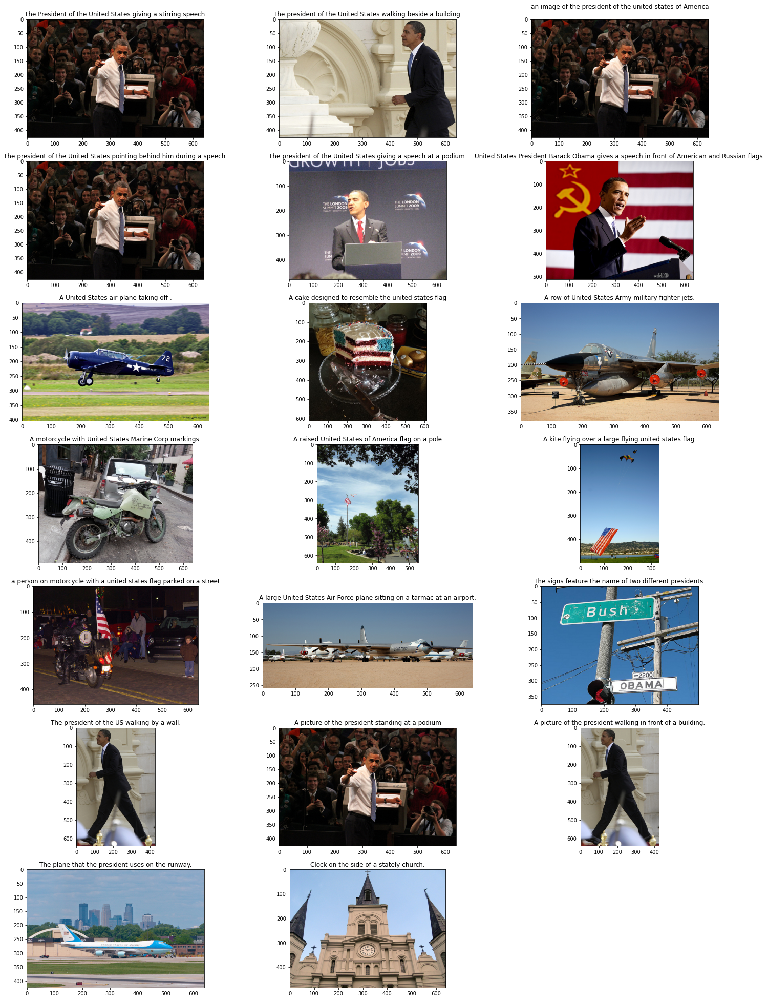

In [41]:
s.search('who is the president of united states')

In [60]:



class system1:
    def __init__(self):
        qm = QuestionMatcher()
        qe = QueryExpansion()
        ir = RetriveImage()
        self.image_captions = []
        self.image_ids = []
        self.data = pd.DataFrame(columns=("caption", "id", "EAT",  "similarity"))
    
    def search(self,question):
        self.image_captions = []
        self.image_ids = []
        focus, eat =  qm.re_match_pattern(question)
        if eat == 'entity':
            eat = self.get_entity_eat(focus)
        #print(focus)
        data = pd.DataFrame()
        while(len(self.image_ids) < 50):
            ir.search(focus)
            print(eat)
            # self.image_captions = list(set(ir.image_caption) - set(self.image_captions))
            # self.image_ids = list(set(ir.image_ids) - set(self.image_ids))
            # print(len())
            print(len(ir.image_ids))
            # for i,id in enumerate(ir.image_ids):
            #     if id not in self.image_ids:
            #         self.image_ids.append(id)
            #         self.image_captions.append(ir.image_caption[i])
                # self.image_captions = ir.image_caption
                # self.image_ids = ir.image_ids
            print(len(self.image_ids))
            data = pd.DataFrame({"caption":self.image_captions, "id":self.image_ids, "EAT":[0]*len(self.image_ids),"similarity":[0]*len(self.image_ids)})
            data = self.get_image_with_correct_synset(eat, focus, data)
           
            #self.get_image_with_number()
        self.data = self.data.append(data)
       # self.data = self.data.sort_values(by=['EAT','similarity'],ascending=False)
        print(self.data.head(50))
        self.display(self.data.head(50)['caption'],self.data.head(50)['id'])
    
    # def creating_query(self, qid, focus):
    #     if qid < 4:
    #         return focus
    #     if qid == 4:




    def try_search(self,question):
        self.image_captions = []
        self.image_ids = []
        ir.image_ids = []
        ir.image_caption = []
        focus, eat =  qm.re_match_pattern(question)
        if eat == 'entity':
            eat = self.get_entity_eat(focus)
        ess = self.get_focus_eat(focus, eat)
        print(eat)
        data = pd.DataFrame()
        ir.search(focus)
        self.image_ids = ir.image_ids
        self.image_captions = ir.image_caption
        data = pd.DataFrame({"caption":self.image_captions, "id":self.image_ids, "EAT":[0]*len(self.image_ids),"similarity":[0]*len(self.image_ids)})
        data = self.get_image_with_correct_synset(eat, focus,ess, data)
       # data = data.loc[data['EAT'] == 1]
        self.data = pd.concat([data, self.data], ignore_index=True)
        
        self.data = self.data.sort_values(by=['EAT','similarity'],ascending=False)
        self.data = self.data.reset_index()
        print(len(self.image_ids))
        if len(self.image_ids) < 50:
            print('expansion')
            exp_query = qe.generate_tokens(focus)
            print(exp_query)
            ir.search(exp_query)
            for i,id in enumerate(ir.image_ids):
                if id not in self.image_ids:
                    self.image_ids.append(id)
                    self.image_captions.append(ir.image_caption[i])
            data = pd.DataFrame({"caption":self.image_captions, "id":self.image_ids, "EAT":[0]*len(self.image_ids),"similarity":[0]*len(self.image_ids)})
            data = self.get_image_with_correct_synset(eat, focus, ess, data)
           
            print(len(self.image_ids))
           # data = data.loc[data['EAT'] == 1]
            self.data = self.data.append(data)
            self.data = self.data.sort_values(by=['EAT','similarity'],ascending=False)
            self.data = self.data.reset_index()
     #   print(self.data.head(50))
        
        self.display(self.data.head(50)['caption'],self.data.head(50)['id'])



    def get_image_with_correct_synset(self, eat:str, focus:str,ess:str, data:DataFrame):
        ess_lamma = nnlp(ess)[0].lemma_
        for index, row in data.iterrows():
            data.at[index, 'similarity'] = nlp(focus).similarity(nlp(row['caption']))
            for token in row['caption'].split():
                # if(token.is_stop):
                #     continue
                #print(token)
                cond = self.check_hypernym(token, eat)
                
                if (cond == 'True'):
                    data.at[index, 'EAT'] = 1
                if nnlp(token)[0].lemma_.lower() == ess_lamma.lower():
                    data.at[index, 'EAT'] = 2
                    # break
            
            # for ent in nlp(row['caption']).ents:
            #     if(eat == 'person' and ent.label_ == 'PERSON'):
            #         self.data.at[index, 'EAT'] = 1
                    
        return data



    def get_focus_eat(self,focus:str,eat:str):
        eat_lamma = nlp(eat)[0].lemma_
        eat_ss = set(ss.name() for ss in wn.synsets(eat_lamma))
        for token in focus.split():
            if nlp(token)[0].is_stop:
                continue
            focus_lamma = nlp(token)[0].lemma_
            word_ss = wn.synsets(focus_lamma)[0]
            hypernyms_ss = {synset.name() for synset in wn.synset(word_ss.name()).hypernym_paths()[0]}
            if len(eat_ss.intersection(hypernyms_ss)) != 0:
                return token
        return ''

    def get_entity_eat(self, focus):
        person_ss = set(ss.name() for ss in wn.synsets("person"))
        location_ss = set(ss.name() for ss in wn.synsets("location"))
        time_ss = set(ss.name() for ss in wn.synsets("time_unit"))
        animal_ss = set(ss.name() for ss in wn.synsets("animal"))
        artifact_ss = set(ss.name() for ss in wn.synsets("artifact"))
        for token in focus.split():
            if nlp(token)[0].is_stop:
                continue
            print(token)
            focus_lamma = nlp(token)[0].lemma_
            if wn.synsets(focus_lamma) == []:
                return "entity"
            focus_ss = wn.synsets(focus_lamma)[0]
            
            hypernyms_ss = {synset.name() for synset in wn.synset(focus_ss.name()).hypernym_paths()[0]}
            if len(person_ss.intersection(hypernyms_ss)) != 0:
                return "person"
            if len(location_ss.intersection(hypernyms_ss)) != 0:
                return "location" 
            if len(time_ss.intersection(hypernyms_ss)) != 0:
                return "time_unit"
            if len(animal_ss.intersection(hypernyms_ss)) != 0:
                return "animal"
            if len(artifact_ss.intersection(hypernyms_ss)) != 0:
                return "artifact"
        return "entity"

        
    def get_image_with_number(self):
        for index, row in self.data.iterrows():
            for token in row['caption'].split():
                if(nlp(token).pos_ == 'NUM'):
                    self.data.at[index, 'EAT'] = 1
            
        
    def check_hypernym(self ,word:str ,sett:str):
        word_lamma = nlp(word)[0].lemma_
        sett_lamma = nlp(sett)[0].lemma_

        if(wn.synsets(word_lamma) == []):
            return 'False'
        word_ss = wn.synsets(word_lamma)[0]

        if(wn.synsets(sett_lamma) == []):
            return 'False'
        sett_ss = set(ss.name() for ss in wn.synsets(sett_lamma))
        hypernyms_ss = {synset.name() for synset in wn.synset(word_ss.name()).hypernym_paths()[0]}
        z = sett_ss.intersection(hypernyms_ss)
        if(len(list(z)) != 0):
           # print('yezzzz')
            return 'True'
        return 'False'



    def display(self,caps:list,ids:list):
        #i = 0
        print(len(ids))
        print(len(caps))
        plt.figure(figsize=(25,100))
        for i, id in enumerate(ids):
            plt.subplot(26, 3, i + 1)
            path = '..\\..\\Cocomo2014\\\\val2014\\\\val2014\\COCO_val2014_'+ '0'*(12 - len(str(ids[i]))) + str(ids[i]) +'.jpg'
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.title(caps[i])
            plt.imshow(img)
s1 = system1()

doors
doors
artifact
100
50
50


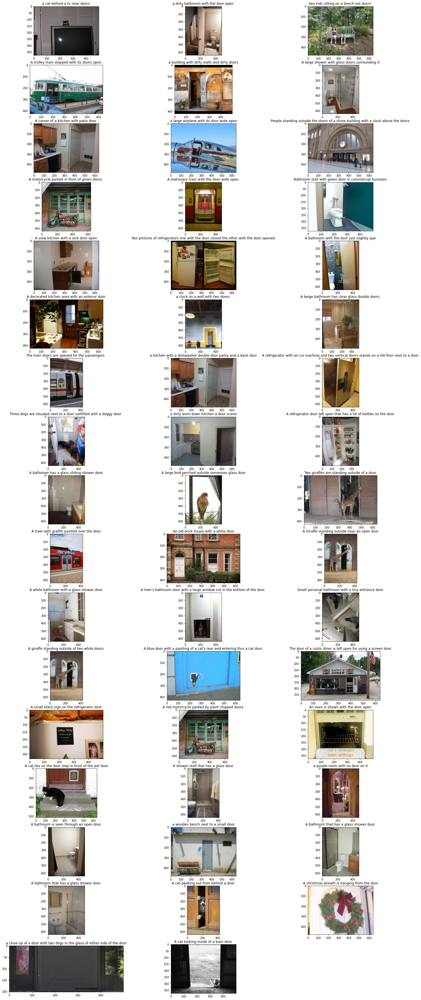

In [61]:
s1.try_search('images that contain doors')

In [42]:
caps = s.image_captions
ids = s.image_ids

In [68]:
wn.synsets('person')

[Synset('person.n.01'), Synset('person.n.02'), Synset('person.n.03')]

In [10]:
def check_hypernym(word ,sett):
    word = nlp(word)[0].lemma_
    sett = nlp(sett)[0].lemma_
    person_ss = set(ss.name() for ss in wn.synsets("person"))
    location_ss = set(ss.name() for ss in wn.synsets("location"))
    time_ss = set(ss.name() for ss in wn.synsets("time_unit"))
    animal_ss = set(ss.name() for ss in wn.synsets("animal"))
    artifact_ss = set(ss.name() for ss in wn.synsets("artifact"))
    if(wn.synsets(word) == []):
        return False
    word_ss = wn.synsets(word)[0]

    if(wn.synsets(sett) == []):
        return False
    sett_ss = set(ss.name() for ss in wn.synsets(sett))
   # print(sett_ss)
   # hypernyms = list()
    #for ss in word_ss:
    hypernyms_ss = {synset.name() for synset in wn.synset(word_ss.name()).hypernym_paths()[0]}
    print(hypernyms_ss)
    # print(animal_ss)
    z = location_ss.intersection(hypernyms_ss)

       # hypernyms.append(hypernyms_ss)
    #print(hypernyms)
    # for synset in hypernyms:
    # z = sett_ss.intersection(hypernyms_ss)
        
    if(len(list(z)) != 0):
        print(z)
        return
    # #         print(z)
    # #         print(sett_ss)
    # #         print(synset)
    # #         break
    # print('not')
    # # return False
check_hypernym('U.S.','location')

{'government.n.01', 'polity.n.02', 'federal_government.n.01', 'social_group.n.01', 'organization.n.01', 'abstraction.n.06', 'united_states_government.n.01', 'group.n.01', 'entity.n.01'}


In [38]:
hypernyms_ss = {synset.name() for synset in wn.synset(ss.name()).hypernym_paths()[0]}

NameError: name 'ss' is not defined

In [86]:
word = 'ta'
word = nlp(word)[0].lemma_
ss =  set(wn.synsets(word))
list(ss)

[Synset('don.n.03'),
 Synset('church_father.n.01'),
 Synset('father.n.05'),
 Synset('father.n.03'),
 Synset('father.n.01'),
 Synset('founder.n.02'),
 Synset('father.n.06'),
 Synset('beget.v.01'),
 Synset('forefather.n.01')]

In [96]:
aftercap =[]
afterids = []
for i, c in enumerate(caps):
    for word in c.split():
        if(check_synset(word, "person")):
            aftercap.append(caps[i])
            afterids.append(ids[i])


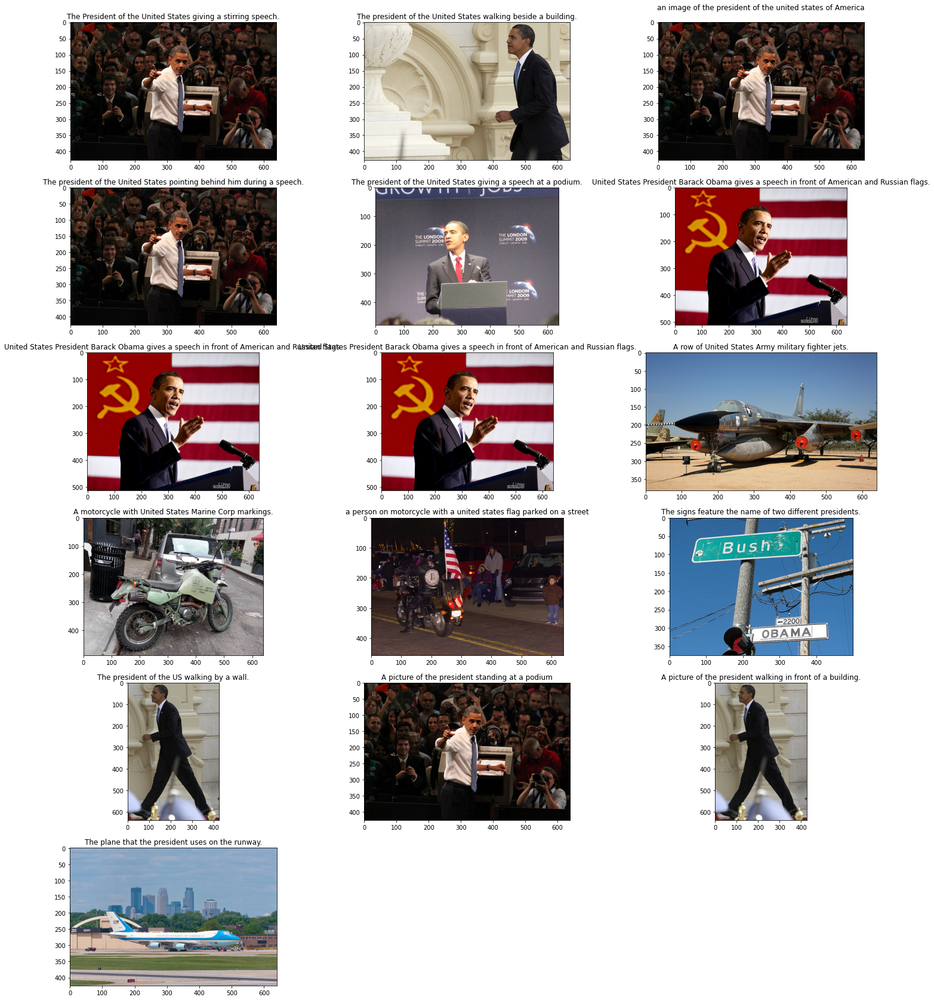

In [97]:
def display():
    i = 0
    plt.figure(figsize=(25,50))
    columns = 2
    for i, id in enumerate(afterids):
        plt.subplot(10, 3, i + 1)
        path = '..\\..\\Cocomo2014\\\\val2014\\\\val2014\\COCO_val2014_'+ '0'*(12 - len(str(id))) + str(id) +'.jpg'
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.title(aftercap[i])
        plt.imshow(img)
display()

In [27]:
doc1 = nlp("president of the united states")
doc2 = nlp("united states president barack obama gives a speech in from of amarican people")

# Similarity of two documents
print(doc1, "<->", doc2, doc2.similarity(doc1))

president of the united states <-> united states president barack obama gives a speech in from of amarican people 0.8304945942449244


In [29]:
wordsynset = wn.synsets('tank')[0]
print(wordsynset)
[synset.name() for synset in wn.synset(wordsynset.name()).hypernym_paths()[0]]

Synset('tank.n.01')


['entity.n.01',
 'physical_entity.n.01',
 'object.n.01',
 'whole.n.02',
 'artifact.n.01',
 'instrumentality.n.03',
 'container.n.01',
 'wheeled_vehicle.n.01',
 'self-propelled_vehicle.n.01',
 'armored_vehicle.n.01',
 'tank.n.01']

In [95]:

vehicle = wn.synset('parent.n.01')
typesOfVehicles = list(set([w for s in vehicle.closure(lambda s:s.hyponyms()) for w in s.lemma_names()]))
print(typesOfVehicles)

['pop', 'pa', 'stepparent', 'para_I', 'mother-in-law', 'stepfather', 'adopter', 'dada', 'old_man', 'stepmother', 'father', 'supermom', 'mother', 'mama', 'father-in-law', 'dad', 'female_parent', 'mamma', 'pater', 'empty_nester', 'surrogate_mother', 'pappa', 'filicide', 'adoptive_parent', 'quadripara', 'mummy', 'mum', 'puerpera', 'mom', 'mammy', 'begetter', 'mommy', 'mater', 'papa', 'quintipara', 'male_parent', 'ma', 'daddy', 'primipara', 'momma']


In [14]:
def synonym_antonym_extractor(phrase):
     from nltk.corpus import wordnet
     synonyms = []
     antonyms = []

     
     for syn in wordnet.synsets(phrase):
          print(syn.lemmas())
          for l in syn.lemmas():

               synonyms.append(l.name())
               if l.antonyms():
                    antonyms.append(l.antonyms()[0].name())
    # print(set(synonyms))
     print(set(antonyms))
synonym_antonym_extractor(phrase="bird")

[Lemma('bird.n.01.bird')]
[Lemma('bird.n.02.bird'), Lemma('bird.n.02.fowl')]
[Lemma('dame.n.01.dame'), Lemma('dame.n.01.doll'), Lemma('dame.n.01.wench'), Lemma('dame.n.01.skirt'), Lemma('dame.n.01.chick'), Lemma('dame.n.01.bird')]
[Lemma('boo.n.01.boo'), Lemma('boo.n.01.hoot'), Lemma('boo.n.01.Bronx_cheer'), Lemma('boo.n.01.hiss'), Lemma('boo.n.01.raspberry'), Lemma('boo.n.01.razzing'), Lemma('boo.n.01.razz'), Lemma('boo.n.01.snort'), Lemma('boo.n.01.bird')]
[Lemma('shuttlecock.n.01.shuttlecock'), Lemma('shuttlecock.n.01.bird'), Lemma('shuttlecock.n.01.birdie'), Lemma('shuttlecock.n.01.shuttle')]
[Lemma('bird.v.01.bird'), Lemma('bird.v.01.birdwatch')]
set()


In [4]:
doc = nlp('three people')
print([(X.text, X.label_) for X in doc.ents])

[]


In [12]:
doc = nlp('give me images that contain more than two people ')
print([X.pos_ for X in doc])

['VERB', 'PRON', 'NOUN', 'PRON', 'VERB', 'NOUN']


In [25]:
[synset.name() for synset in wn.synset('sea.n.01').hypernym_paths()[0]]

['entity.n.01',
 'physical_entity.n.01',
 'thing.n.12',
 'body_of_water.n.01',
 'sea.n.01']

In [65]:
def creating_query(caption:str):
    caption = caption.lower()
    must = []
    must_not = []
    should = []
    lcaption = caption.split()
    for i,word in enumerate(caption.split()):
        hh
           
creating_query("caption and me")

yes
